In [ ]:
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import os
import sys
import random
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
sys.path.insert(0, '/content/drive/MyDrive/Computer Vision/breast/classification/Functions')
from load_images_breast import load_images_breast

### Load data

In [ ]:
# Define the path to your data folders
data_path = '/content/drive/MyDrive/Computer Vision/Dataset/Breast scans'

# Load images and labels
images, labels = load_images_breast(data_path)

# shuffle images and labels
combined = list(zip(images, labels))
random.shuffle(combined)
images, labels = zip(*combined)

In [ ]:
print(len(images))
print(len(labels))

780
780


label: 2


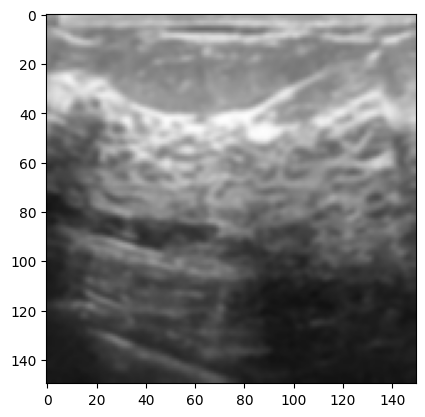

In [ ]:
plt.imshow(images[680])
print("label:", labels[680])

### Train test split

In [61]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42)

# Convert the images to numpy arrays and normalize the pixel values
X_train = np.array(X_train).astype(np.float32)/255
X_test = np.array(X_test).astype(np.float32)/255
y_train = np.array(y_train)
y_test = np.array(y_test)

# check shapes
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(624, 150, 150, 3)
(156, 150, 150, 3)
(624,)
(156,)


In [63]:
# Convert the labels into one-hot encoded vectors
y_train = to_categorical(y_train, num_classes=3)
y_test = to_categorical(y_test, num_classes=3)

### Build the model

In [64]:
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dense(3, activation='softmax'))

In [65]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 74, 74, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 17, 17, 128)     

In [66]:
# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/10
20/20 [==============================] - 38s 2s/step - loss: 0.9686 - accuracy: 0.5545 - val_loss: 0.9565 - val_accuracy: 0.5513
Epoch 2/10
20/20 [==============================] - 38s 2s/step - loss: 0.8788 - accuracy: 0.6218 - val_loss: 0.8708 - val_accuracy: 0.6346
Epoch 3/10
20/20 [==============================] - 36s 2s/step - loss: 0.7938 - accuracy: 0.6587 - val_loss: 0.8779 - val_accuracy: 0.6218
Epoch 4/10
20/20 [==============================] - 37s 2s/step - loss: 0.7220 - accuracy: 0.6939 - val_loss: 0.9194 - val_accuracy: 0.6603
Epoch 5/10
20/20 [==============================] - 36s 2s/step - loss: 0.6800 - accuracy: 0.7179 - val_loss: 0.8234 - val_accuracy: 0.6474
Epoch 6/10
20/20 [==============================] - 38s 2s/step - loss: 0.5900 - accuracy: 0.7436 - val_loss: 0.7420 - val_accuracy: 0.7051
Epoch 7/10
20/20 [==============================] - 36s 2s/step - loss: 0.5148 - accuracy: 0.7901 - val_loss: 0.6960 - val_accuracy: 0.7244
Epoch 8/10
20/20 [==

## Save the model

In [67]:
model.save('breastClassifier.h5')

## Evaluate the model

In [68]:
# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test accuracy:', accuracy)

Test loss: 0.788267970085144
Test accuracy: 0.75


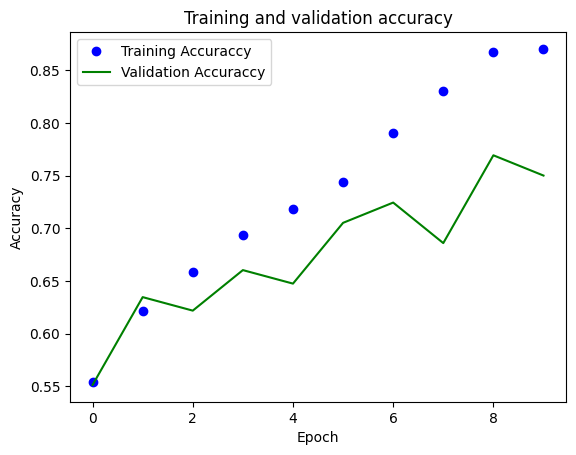

In [69]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training Accuraccy')
plt.plot(epochs, val_acc, 'g', label='Validation Accuraccy')
plt.title('Training and validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

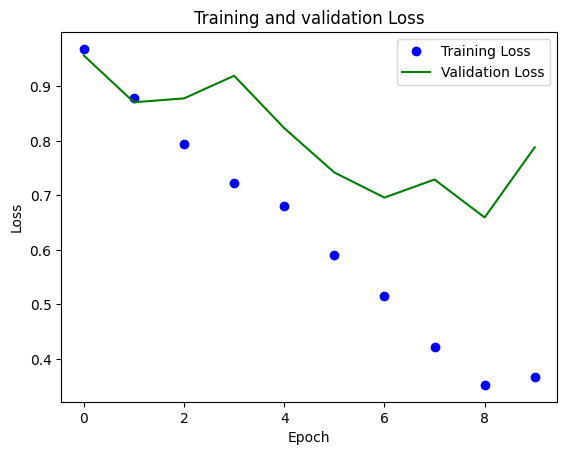

In [70]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))

plt.plot(epochs, loss, 'bo', label='Training Loss')
plt.plot(epochs, val_loss, 'g', label='Validation Loss')
plt.title('Training and validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Evaluate using different metrics 

In [71]:
from sklearn.metrics import confusion_matrix, classification_report

In [72]:
# Predict the test labels
y_pred = model.predict(X_test)

# Convert the predicted labels to integer-encoded labels
y_pred_encoded = np.argmax(y_pred, axis=1)

# Convert the one-hot encoded test labels to integer-encoded labels
y_test_encoded = np.argmax(y_test, axis=1)

# Compute the classification report
print(classification_report(y_test_encoded, y_pred_encoded))


5/5 [==============================] - 2s 422ms/step
              precision    recall  f1-score   support

           0       0.73      0.91      0.81        81
           1       0.80      0.51      0.62        47
           2       0.76      0.68      0.72        28

    accuracy                           0.75       156
   macro avg       0.76      0.70      0.72       156
weighted avg       0.76      0.75      0.74       156



In [73]:
cm = confusion_matrix(y_test_encoded, y_pred_encoded)

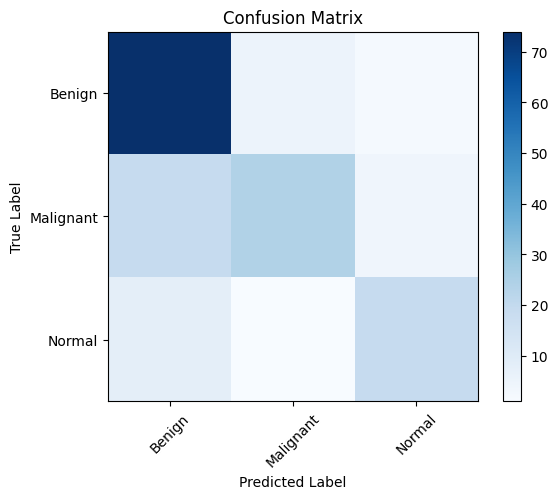

In [74]:
# Plot the confusion matrix
plt.imshow(cm, cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(3)
plt.xticks(tick_marks, ['Benign', 'Malignant', 'Normal'], rotation=45)
plt.yticks(tick_marks, ['Benign', 'Malignant', 'Normal'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [75]:
predictions = model.predict(X_test)

5/5 [==============================] - 3s 632ms/step


In [76]:
predictions = np.round(predictions)

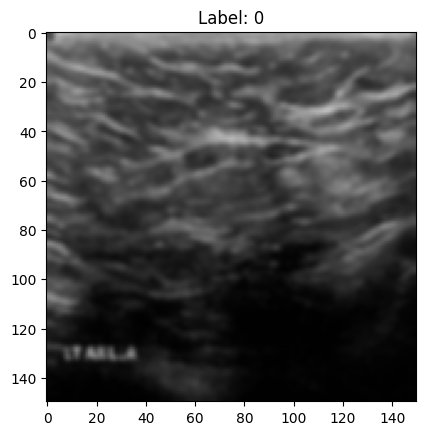

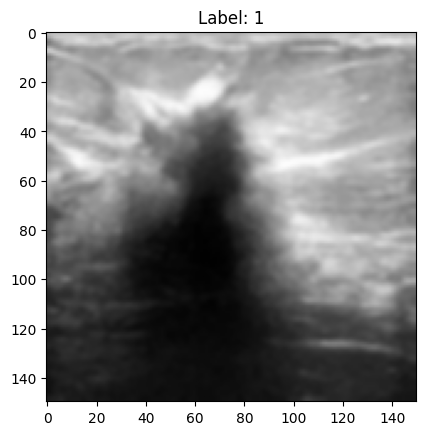

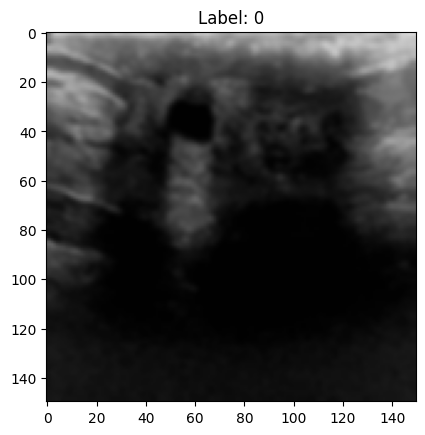

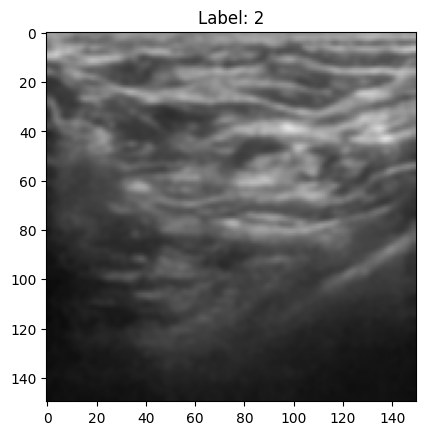

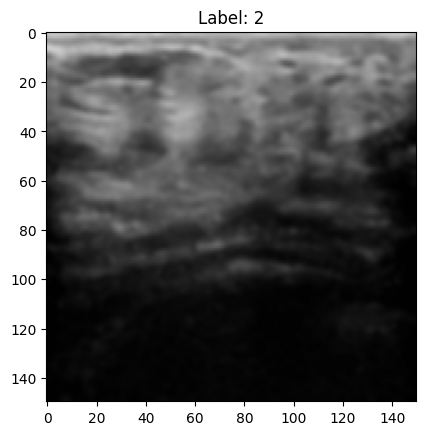

...

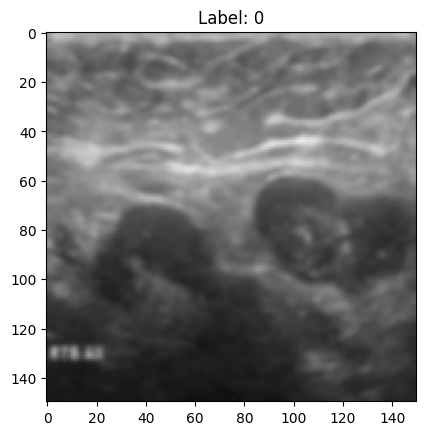

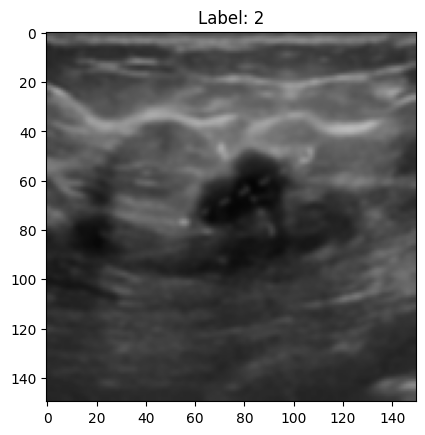

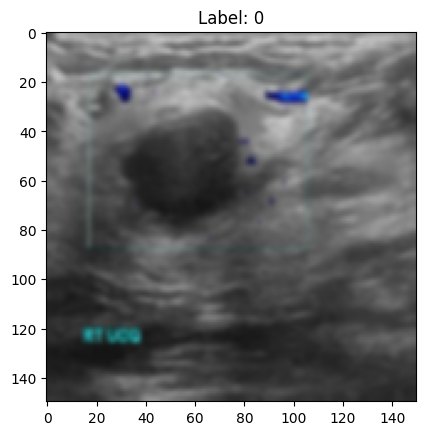

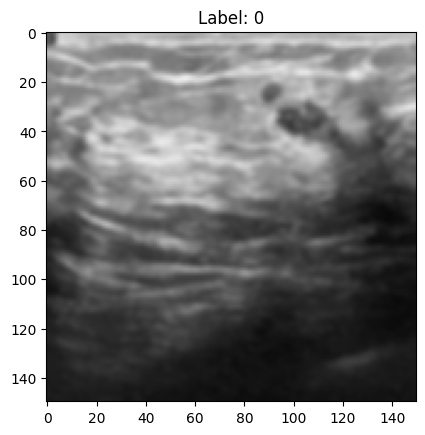

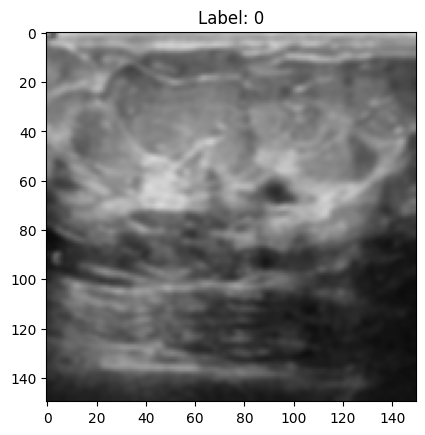

In [77]:
for i in range(len(predictions)):
  try:
    label = (np.where(predictions[i]==1)[0][0])
  except:
    label = 0

  plt.imshow(X_test[i])
  plt.title(f"Label: {label}")
  plt.show()